In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import datetime
import time
from matplotlib import pyplot as plt
from pandas_profiling import ProfileReport

In [2]:
df = pd.read_csv("forest_fires_dataset.csv")
inf = pd.read_csv("attributes_forest_fires.csv")

In [3]:
# Na początku możemy zobaczyć jak wygląda nasza ramka danych (head i tail jednocześnie)
df

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,mar,fri,86.2,26.2,94.3,5.1,8.2,51.0,6.7,0.0,0.00
1,7,4,oct,tue,90.6,35.4,669.1,6.7,18.0,33.0,0.9,0.0,0.00
2,7,4,oct,sat,90.6,43.7,686.9,6.7,14.6,33.0,1.3,0.0,0.00
3,8,6,mar,fri,91.7,33.3,77.5,9.0,8.3,97.0,4.0,0.2,0.00
4,8,6,mar,sun,89.3,51.3,102.2,9.6,11.4,99.0,1.8,0.0,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...
512,4,3,aug,sun,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44
513,2,4,aug,sun,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29
514,7,4,aug,sun,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16
515,1,4,aug,sat,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00


In [4]:
# Wyswietlimy jeszcze, co oznacza kazda z kolumn ramki danych
pd.set_option('display.max_colwidth', 150)
inf

,name,type,description
0,X,integer,x-axis spatial coordinate within the Montesinho park map: 1 to 9
1,Y,integer,y-axis spatial coordinate within the Montesinho park map: 2 to 9
2,month,string,month of the year: 'jan' to 'dec'
3,day,string,day of the week: 'mon' to 'sun'
4,FFMC,float,FFMC index from the FWI system: 18.7 to 96.20
5,DMC,float,DMC index from the FWI system: 1.1 to 291.3
6,DC,float,DC index from the FWI system: 7.9 to 860.6
7,ISI,float,ISI index from the FWI system: 0.0 to 56.10
8,temp,float,temperature in Celsius degrees: 2.2 to 33.30
9,RH,float,relative humidity in %: 15.0 to 100


Większość kolumn opisuje się samo i zrozumiale, warto jednak sprawdzić, czym są FFMC, DMC, DC, ISI pochodzące z FWI (Fire Weather Index).
Znaczenia tych indeksów pochodzą ze strony https://www.nwcg.gov/publications/pms437/cffdrs/fire-weather-index-system

* The Fine Fuel Moisture Code (FFMC) represents fuel moisture of forest litter fuels under the shade of a forest canopy. It is intended to represent moisture conditions for shaded litter fuels, the equivalent of 16-hour timelag. It ranges from 0-101. Subtracting the FFMC value from 100 can provide an estimate for the equivalent (approximately 10h) fuel moisture content, most accurate when FFMC values are roughly above 80.
* The Duff Moisture Code (DMC) represents fuel moisture of decomposed organic material underneath the litter. System designers suggest that it is represents moisture conditions for the equivalent of 15-day (or 360 hr) timelag fuels. It is unitless and open ended. It may provide insight to live fuel moisture stress.
* The Drought Code (DC), much like the Keetch-Byrum Drought Index, represents drying deep into the soil. It approximates moisture conditions for the equivalent of 53-day (1272 hour) timelag fuels. It is unitless, with a maximum value of 1000. Extreme drought conditions have produced DC values near 800.
* The Initial Spread Index (ISI) is analogous to the NFDRS Spread Component (SC). It integrates fuel moisture for fine dead fuels and surface windspeed to estimate a spread potential. ISI is a key input for fire behavior predictions in the FBP system. It is unitless and open ended.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   X       517 non-null    int64  
 1   Y       517 non-null    int64  
 2   month   517 non-null    object 
 3   day     517 non-null    object 
 4   FFMC    517 non-null    float64
 5   DMC     517 non-null    float64
 6   DC      517 non-null    float64
 7   ISI     517 non-null    float64
 8   temp    517 non-null    float64
 9   RH      517 non-null    float64
 10  wind    517 non-null    float64
 11  rain    517 non-null    float64
 12  area    517 non-null    float64
dtypes: float64(9), int64(2), object(2)
memory usage: 52.6+ KB


Widzimy, że nasza ramka danych nie zawiera żadnych braków danych - poiwnno nas to cieszyć.

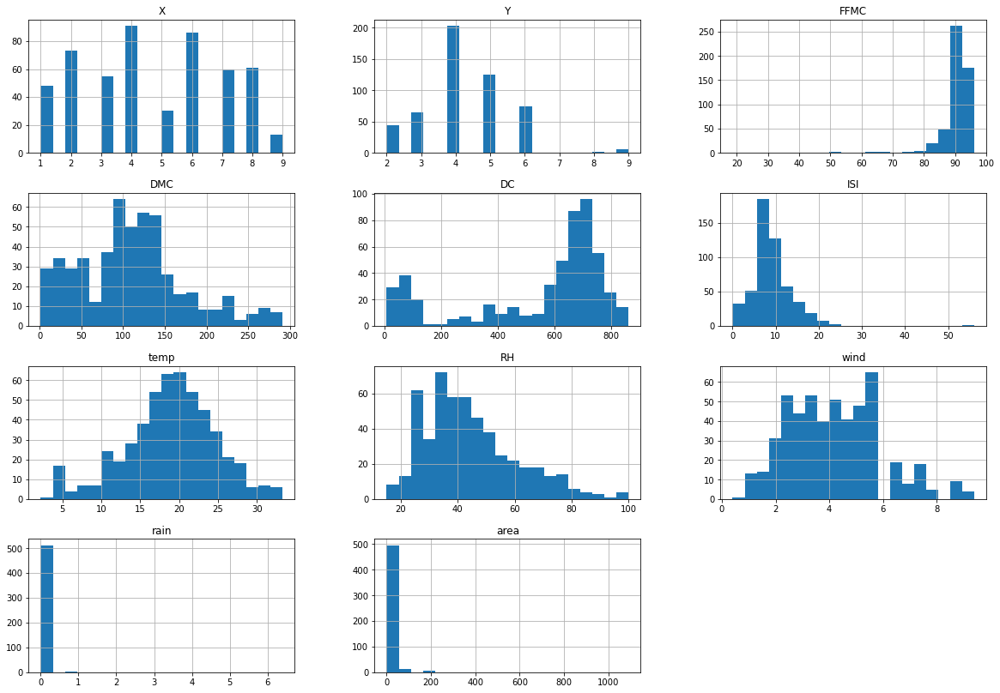

In [6]:
df.hist(bins = 20, figsize = (20, 14))
plt.show()

## Rozkłady zmiennych
* tak jak zostało wspomniane w opisie kolumny area, prawie wszystkie wartości są przy zerze, a wykres jest bardzo skośny
* podobnie jak kolumna area, zachowuje się kolumna rain - widać, że prawie we wszystkich przypadkach nie występowały opady deszczu
* najbardziej symetryczny rozkład jest widoczny w przypadku temperatury
* skośny (głównie skumulowany blisko maksymalnej wartości indeksu) jest także wskaźnik FFMC (wilgotność ściółki leśnej)

In [7]:
# Ze wzgledu na taki rozklad zmiennych area, skorzystamy z tego, co zostało wspomniane w opisie kolumny - tzn.
# że będziemy korzystać z logarytmu ln(area + 1)
df['area_log'] = np.log1p(df['area'])
# Zamienimy też nazwy miesięcy i dni na liczby (to zwiekszy czytelność późniejszych wykresów)
df['month'] = df['month'].apply(lambda x: time.strptime(x, "%b").tm_mon)
df['day'] = df['day'].apply(lambda x: time.strptime(x, "%a").tm_wday + 1)
df.tail()

,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,area_log
512,4,3,8,7,81.6,56.7,665.6,1.9,27.8,32.0,2.7,0.0,6.44,2.006871
513,2,4,8,7,81.6,56.7,665.6,1.9,21.9,71.0,5.8,0.0,54.29,4.012592
514,7,4,8,7,81.6,56.7,665.6,1.9,21.2,70.0,6.7,0.0,11.16,2.498152
515,1,4,8,6,94.4,146.0,614.7,11.3,25.6,42.0,4.0,0.0,0.00,0.000000
516,6,3,11,2,79.5,3.0,106.7,1.1,11.8,31.0,4.5,0.0,0.00,0.000000


### Korelacje zmiennych

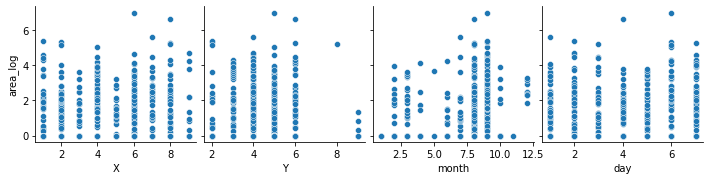

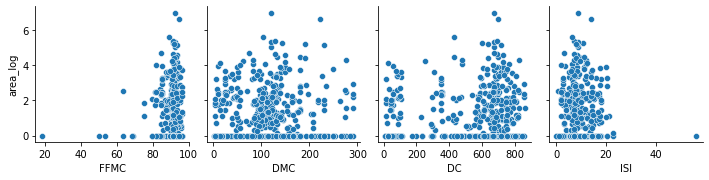

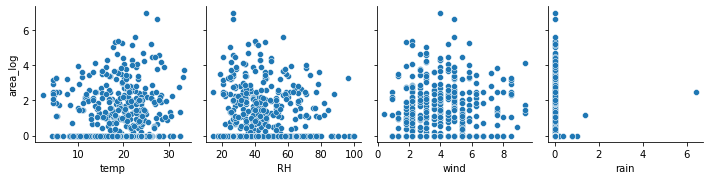

In [8]:
sns.pairplot(df, y_vars="area_log", x_vars=df.columns.values[:4], diag_kind = None)
sns.pairplot(df, y_vars="area_log", x_vars=df.columns.values[4:8], diag_kind = None)
sns.pairplot(df, y_vars="area_log", x_vars=df.columns.values[8:12], diag_kind = None)
plt.show()

Nie widać zbyt wielu korelacji, ale może warto zwrócić uwagę na:
* kolumnę rain, widać, że prawie wszstkie pożary były podczas zerowych opadów i wtedy też częściej spalona została niezerowa powierzchnia
* duże zagęszczenie pożarów widać w miesiącach 8 (sierpień) i 9 (wrzesień)

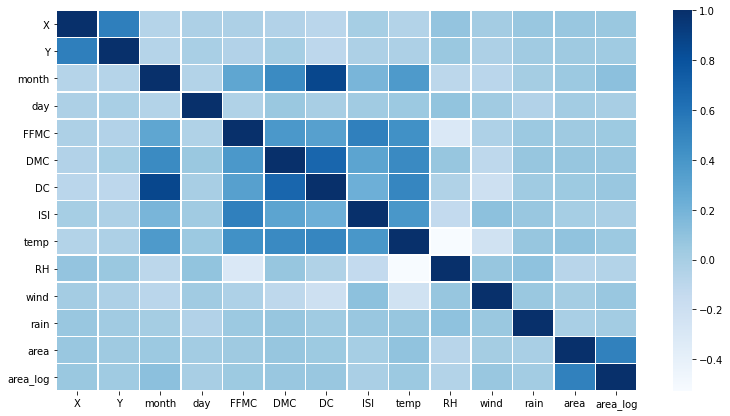

In [9]:
# Stworzymy heatmapę pokazującą korelacje pomiędzy różnymi zmiennymi
fig, ax = plt.subplots(figsize=(13,7)) 
sns.heatmap(df.corr(), linewidths=.5, cmap="Blues")
plt.show()

Właściwie nie widać żadnych korelacji zmiennej "area_log" (z wyjątkiem z samą sobą i area). Widać nastomiast korelacje korelacje pomiędzy wartościami z kolumn month, FFMC, DMC, DC, ISI i temp. Spróbujemy jeszcze tę korelację pokazać na dokładniejszych wykresach.

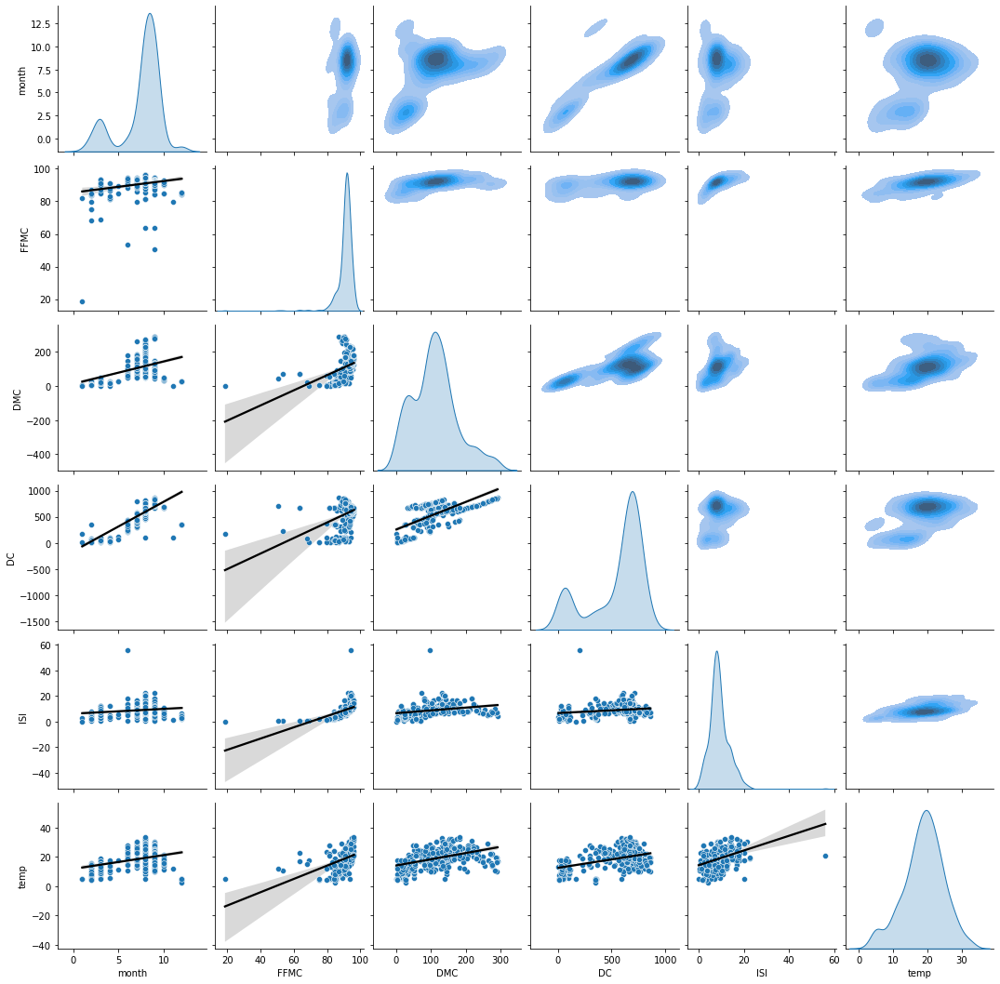

In [10]:
columns = ["month", "FFMC", "DMC", "DC", "ISI", "temp"]
g = sns.pairplot(df, x_vars=columns, y_vars=columns, diag_kind="kde", kind="none")
g = g.map_lower(sns.regplot, scatter=False, color="black")
g = g.map_upper(sns.kdeplot, fill=True)
g.map_lower(sns.scatterplot)

plt.show()

## Pandas profiling

In [14]:
df = pd.read_csv("forest_fires_dataset.csv")
ProfileReport(df, title="Pandas Profiling Report")

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Narzędzie pandas-profiling wydaje się być bardzo przydatnym, przynajmniej żeby na początku przyjrzeć się danym i podstawowym korelacjom. Ciekawe i na pewno przydatne są wyświetlane warningi, poza tym mamy wykresy korelacji oraz interaktwną sekcje, w której możemy wyświetlić scatterplot dowolnych dwóch zmiennych (gdzie wadą jest brak podglądu kilku wykresów jednocześnie - można wyświetlać tylko jeden w danym momencie). Ogólnie narzędzie to robi dużo podstaw do dalszej pracy, często będą potrzebne różne modyfikacje (tak jak np. używaliśmy logarytmu z powierzchni, zamiast samej powierzchni).